In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import scipy.stats
from statistics import mean
from statistics import stdev

from collections import Counter
import warnings # Turn off warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split, KFold, cross_validate, cross_val_score
from imblearn.over_sampling import RandomOverSampler, SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, roc_auc_score, roc_curve, precision_score, recall_score, accuracy_score, precision_recall_curve, confusion_matrix

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

from ipywidgets import interactive, FloatSlider
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
from IPython.display import Image
import pydotplus

In [11]:
# Plotting

def make_confusion_matrix(model, threshold=0.5):
    """
    Predict class1 if probability of being in class 1 is greater than threshold
    """
    y_predict = (model.predict_proba(features_test_scaled_array)[:, 1] >= threshold)
    confusion = confusion_matrix(target_test_ser, y_predict)
    plt.figure(dpi=80)
    sns.heatmap(confusion, cmap='YlGn', annot=True, square=True, fmt='d',
           xticklabels=['Rejected', 'Accepted'],
           yticklabels=['Rejected', 'Accepted']);
    plt.xlabel('Predicted', fontsize=12)
    plt.ylabel('Actual', fontsize=12)
    plt.title('Confusion Matrix for Random Forest', fontsize=16);
    #plt.savefig("Figures/Heatmap.png", transparent=False, bbox_inches="tight")

def plot_heat_map(data_df):
    global ax
    plt.figure(figsize=(8, 5))
    sns.heatmap(data_df.corr(), cmap= 'coolwarm', annot=True)
    ax = plt.axes()

In [3]:
# Import
physics_df = pd.read_csv('Data/physics_ft_df.csv')
physics_df = physics_df.drop(columns = ["Unnamed: 0"])
print(physics_df.columns)

Index(['GPA', 'GRE_Verbal', 'GRE_Quantitative', 'GRE_Writing', 'GRE_Subject',
       'American', 'Papers', 'Research', 'Decision', 'GPA_rev',
       'GRE_Verbal_rev', 'GRE_Quantitative_rev', 'GRE_Writing_rev',
       'GRE_Subject_rev', 'Decision_rev', 'GPA_log', 'GRE_Verbal_log',
       'GRE_Quantitative_log', 'GRE_Writing_log', 'GRE_Subject_log', 'GPA_sq',
       'GRE_Verbal_sq', 'GRE_Quantitative_sq', 'GRE_Writing_sq',
       'GRE_Subject_sq', 'GRE_Verbal_pc', 'GRE_Quantitative_pc',
       'GRE_Writing_pc', 'GRE_Subject_pc', 'GREVxGREQ', 'GREVxGRES',
       'GREQxGRES', 'GREVxGREQxGRES'],
      dtype='object')


In [5]:
# Used for K-fold Cross Validation
kf = KFold(n_splits=5, shuffle=True, random_state = 71)
scaler = StandardScaler()
ros = RandomOverSampler(random_state=0)

In [6]:
# Set aside 20% of data for final test, should predict Decision, because we want to study effects of each
features_train_all_df, features_test_all_df, target_train_ser, target_test_ser = train_test_split(physics_df.drop(columns = ['Decision']), physics_df['Decision'], test_size=.2, random_state=42)

# Choose features
features_list = ['GPA', 'GPA_sq', 'GRE_Verbal', 'GRE_Quantitative', 'GRE_Writing_pc', 'GRE_Subject', 'GREVxGRES', 'American', 'Papers', 'Research']
features_train_chosen_df = features_train_all_df[features_list]
features_test_chosen_df = features_test_all_df[features_list]
features_train_chosen_array = np.array(features_train_chosen_df)
target_train_array = np.array(target_train_ser)

val_f1_score:  0.5595396334608589  +/-  0.03761735112580799
val_roc_auc_score:  0.6194819649340642  +/-  0.020966767490122714
test f1 score =  0.591549295774648
test ROC AUC score =  0.6490221474521349
test accuracy score =  0.6196721311475409


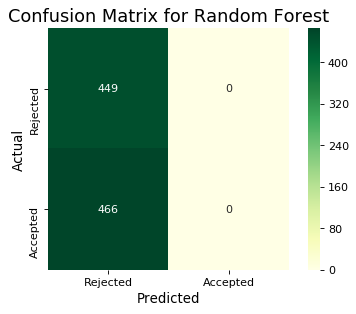

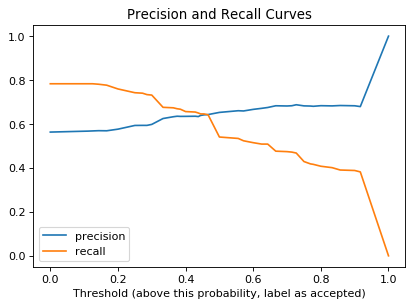

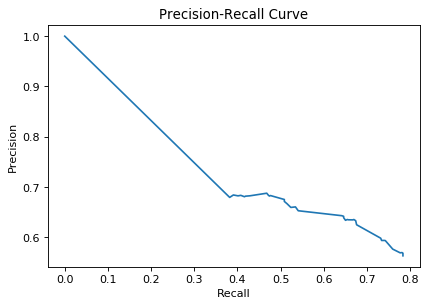

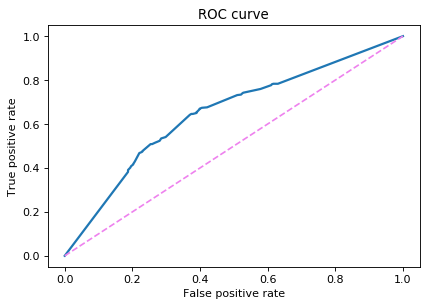

In [19]:
# Initialize model
dt_clf = DecisionTreeClassifier(random_state = 42)

# Collect the cross-validation results
cv_f1_list, roc_auc_list = [], []

for train_index, val_cv_index in kf.split(features_train_chosen_array, target_train_array):
    
    # Make the split
    features_train_cv_array, target_train_cv_array = features_train_chosen_array[train_index], target_train_array[train_index]
    features_val_cv_array, target_val_cv_array = features_train_chosen_array[val_cv_index], target_train_array[val_cv_index] 
    
    # Rebalance train features, no need to rebalance validation set, resample is better than smote
    features_train_cv_resampled_array, target_train_cv_resampled_array = ros.fit_sample(features_train_cv_array, target_train_cv_array)
   
    dt_clf.fit(features_train_cv_resampled_array, target_train_cv_resampled_array) # Fit model
    cv_f1_list.append(f1_score(dt_clf.predict(features_val_cv_array), target_val_cv_array)) # Collect results
    roc_auc_list.append(roc_auc_score(target_val_cv_array, dt_clf.predict_proba(features_val_cv_array)[:,1])) # Collect results

print('val_f1_score: ', mean(cv_f1_list),' +/- ', stdev(cv_f1_list))
print('val_roc_auc_score: ', mean(roc_auc_list),' +/- ', stdev(roc_auc_list))

# Final train and test

# Rebalance train features, no need to rebalance validation set, resample is better than smote
features_train_resampled_array, target_train_resampled_array = ros.fit_sample(features_train_chosen_array, target_train_array)
features_train_resampled_scaled_array = scaler.fit_transform(features_train_resampled_array) # Scale features
features_test_scaled_array = scaler.transform(features_test_chosen_df) # Scale features

dt_clf.fit(features_train_resampled_array, target_train_resampled_array) # Fit model
dt_fpr, dt_tpr, dt_thresholds = roc_curve(target_test_ser, dt_clf.predict_proba(features_test_scaled_array)[:,1]) # For later

print("test f1 score = ", f1_score(dt_clf.predict(features_test_chosen_df), target_test_ser))
print("test ROC AUC score = ", roc_auc_score(target_test_ser, dt_clf.predict_proba(features_test_chosen_df)[:,1]))
print("test accuracy score = ", accuracy_score(target_test_ser, dt_clf.predict(features_test_chosen_df)))

make_confusion_matrix(dt_clf, threshold=0.5)

# Precision and recall curve
precision_curve, recall_curve, threshold_curve = precision_recall_curve(target_test_ser, dt_clf.predict_proba(features_test_chosen_df)[:,1])
plt.figure(dpi=80)
plt.plot(threshold_curve, precision_curve[1:],label='precision')
plt.plot(threshold_curve, recall_curve[1:], label='recall')
plt.legend(loc='lower left')
plt.xlabel('Threshold (above this probability, label as accepted)');
plt.title('Precision and Recall Curves');

# Precision-recall curve
plt.figure(dpi=80)
plt.plot(recall_curve[1:], precision_curve[1:],label='precision')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve");

# ROC Curve
fpr, tpr, thresholds = roc_curve(target_test_ser, dt_clf.predict_proba(features_test_chosen_df)[:,1])
plt.figure(dpi=80)
plt.plot(fpr, tpr, lw=2)
plt.plot([0,1],[0,1],c='violet',ls='--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve');

In [20]:
#This allows us to make a decision tree real fast directly in the notebook!
dot_data = StringIO()  
export_graphviz(dt_clf, out_file=dot_data,  
                    feature_names=features_test_chosen_df.columns.tolist(),  
                    filled=True, rounded=True,  
                    special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.679517 to fit



In [21]:
# Initialize model
dt3_clf = DecisionTreeClassifier(max_depth=3, random_state = 42)

# KFold Cross-Validation

# Collect the cross-validation results
cv_f1_list, roc_auc_list = [], []

for train_index, val_cv_index in kf.split(features_train_chosen_array, target_train_array):
    
    # Make the split
    features_train_cv_array, target_train_cv_array = features_train_chosen_array[train_index], target_train_array[train_index]
    features_val_cv_array, target_val_cv_array = features_train_chosen_array[val_cv_index], target_train_array[val_cv_index] 
    
    # Rebalance train features, no need to rebalance validation set, resample is better than smote
    features_train_cv_resampled_array, target_train_cv_resampled_array = ros.fit_sample(features_train_cv_array, target_train_cv_array)
   
    dt3_clf.fit(features_train_cv_resampled_array, target_train_cv_resampled_array) # Fit model
    cv_f1_list.append(f1_score(dt3_clf.predict(features_val_cv_array), target_val_cv_array)) # Collect results
    roc_auc_list.append(roc_auc_score(target_val_cv_array, dt3_clf.predict_proba(features_val_cv_array)[:,1])) # Collect results

print('val_f1_score: ', mean(cv_f1_list),' +/- ', stdev(cv_f1_list))
print('val_roc_auc_score: ', mean(roc_auc_list),' +/- ', stdev(roc_auc_list))

# Final train and test

# Rebalance train features, no need to rebalance validation set, resample is better than smote
features_train_resampled_array, target_train_resampled_array = ros.fit_sample(features_train_chosen_array, target_train_array)
features_train_resampled_scaled_array = scaler.fit_transform(features_train_resampled_array) # Scale features
features_test_scaled_array = scaler.transform(features_test_chosen_df) # Scale features

dt3_clf.fit(features_train_resampled_array, target_train_resampled_array) # Fit model

print("test f1 score = ", f1_score(dt3_clf.predict(features_test_chosen_df), target_test_ser))
print("test ROC AUC score = ", roc_auc_score(target_test_ser, dt3_clf.predict_proba(features_test_chosen_df)[:,1]))
print("test accuracy score = ", accuracy_score(target_test_ser, dt3_clf.predict(features_test_chosen_df)))

val_f1_score:  0.5563492202142183  +/-  0.04025289965382383
val_roc_auc_score:  0.5906188770206684  +/-  0.009251406513943045
test f1 score =  0.5355450236966824
test ROC AUC score =  0.5907906936731124
test accuracy score =  0.571584699453552


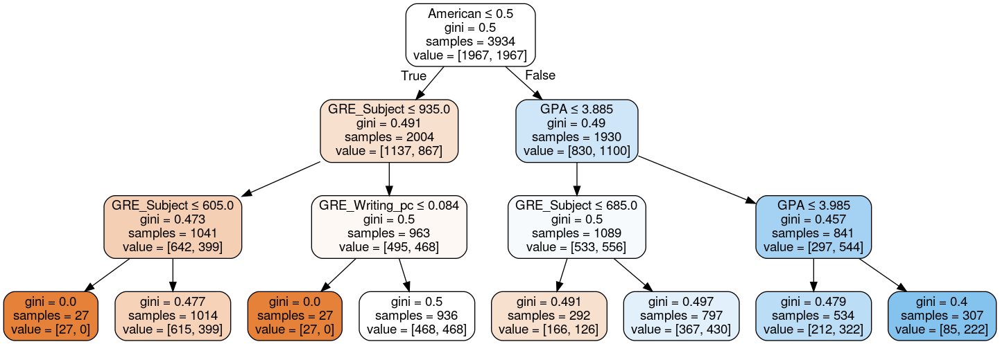

In [41]:
#This allows us to make a decision tree real fast directly in the notebook!
dot_data = StringIO()  
export_graphviz(dt3_clf, out_file=dot_data,  
                    feature_names=features_train_chosen_df.columns.tolist(),  
                    filled=True, rounded=True,  
                    special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())  